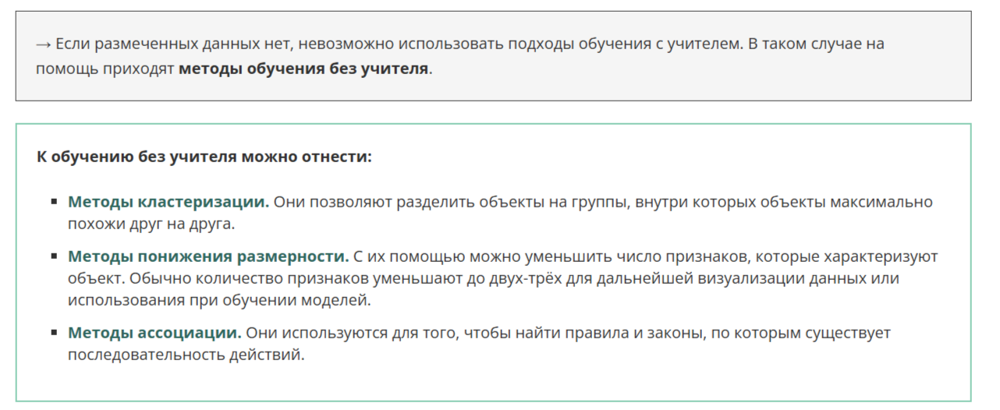

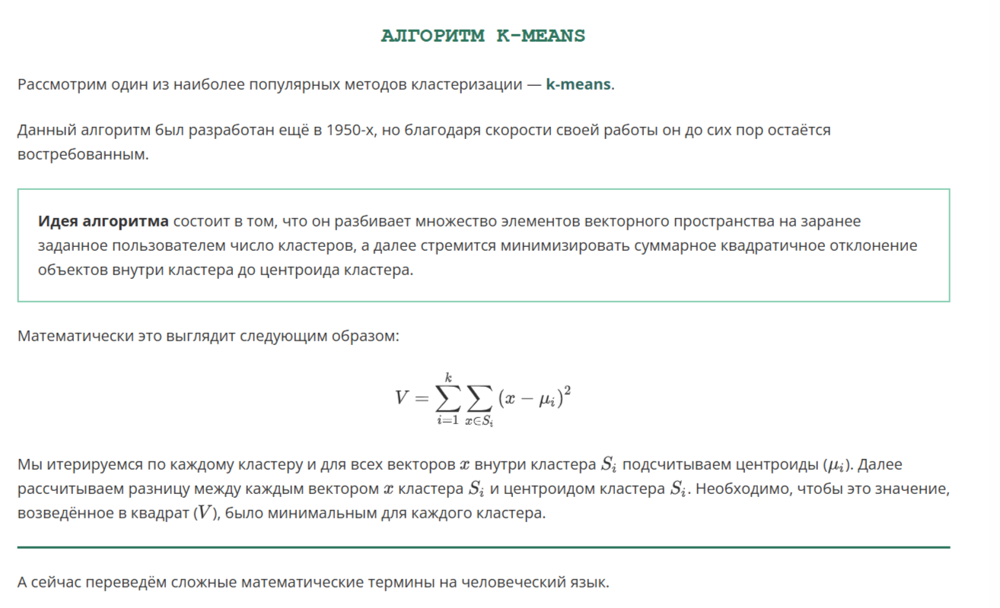

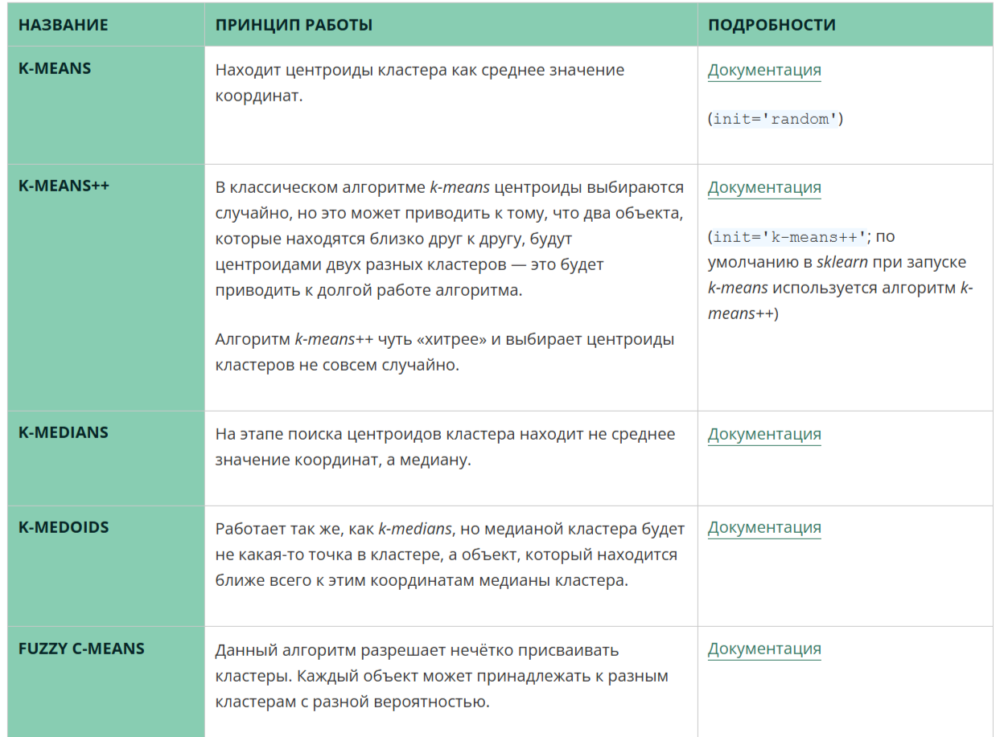

In [4]:
# # импортируем нужный модуль k-means-кластеризации
# from sklearn.cluster import KMeans

# # инициализируем алгоритм, при желании задаём разные параметры для алгоритма
# k_means = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=42)
# X = df[["x1", "x2", "x3"]]
# # обучаем модель на данных, передав матрицу наблюдений X
# k_means.fit(X)
# # получаем результаты кластеризации (список меток, к какому кластеру относится каждый объект из X)
# labels = k_means.labels_

X_new = df2[["x1", "x2", "x3"]]
k_means.predict(X_new)

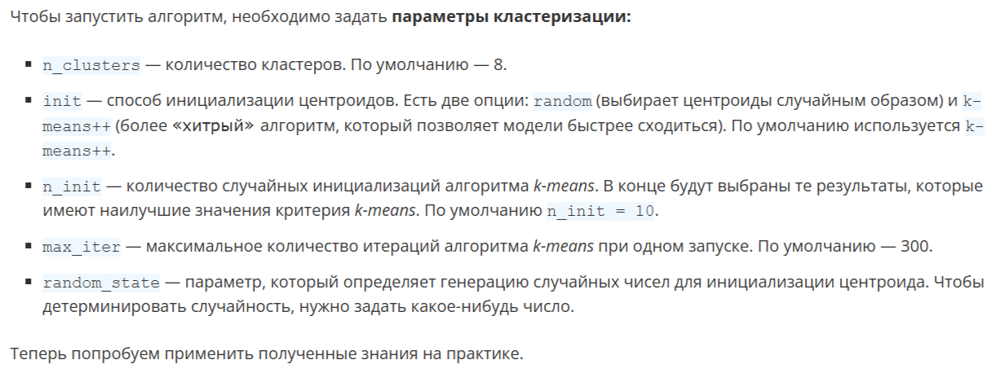

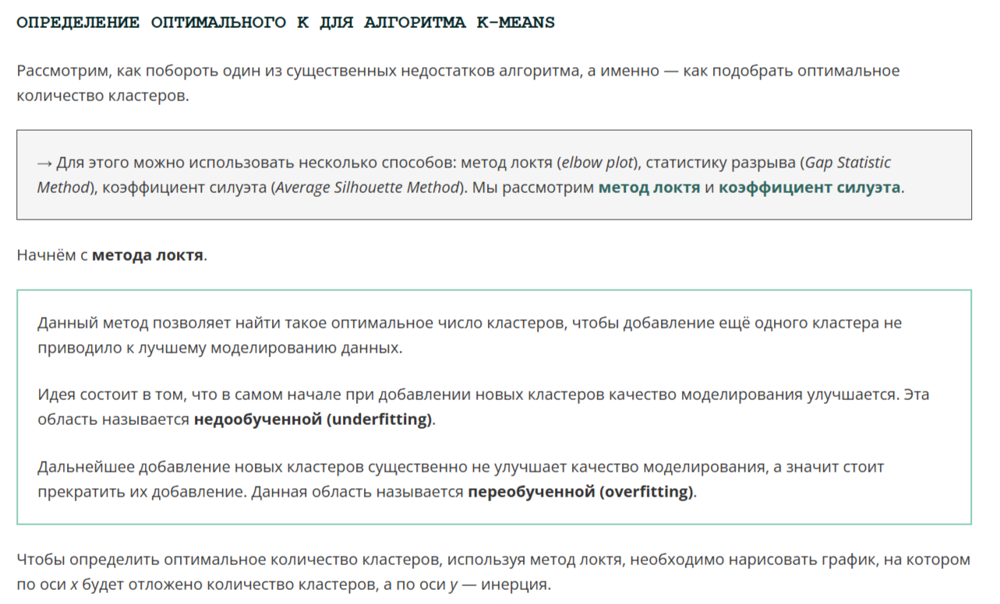

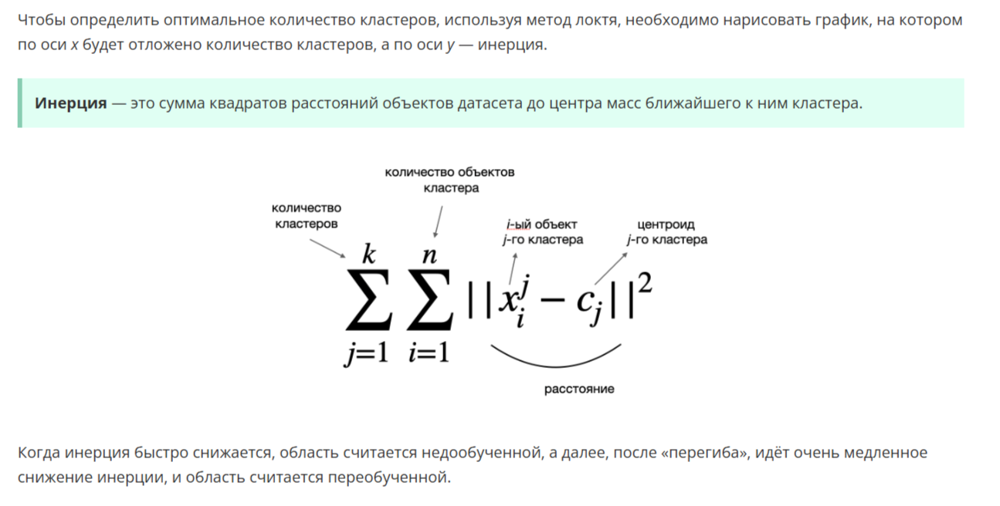

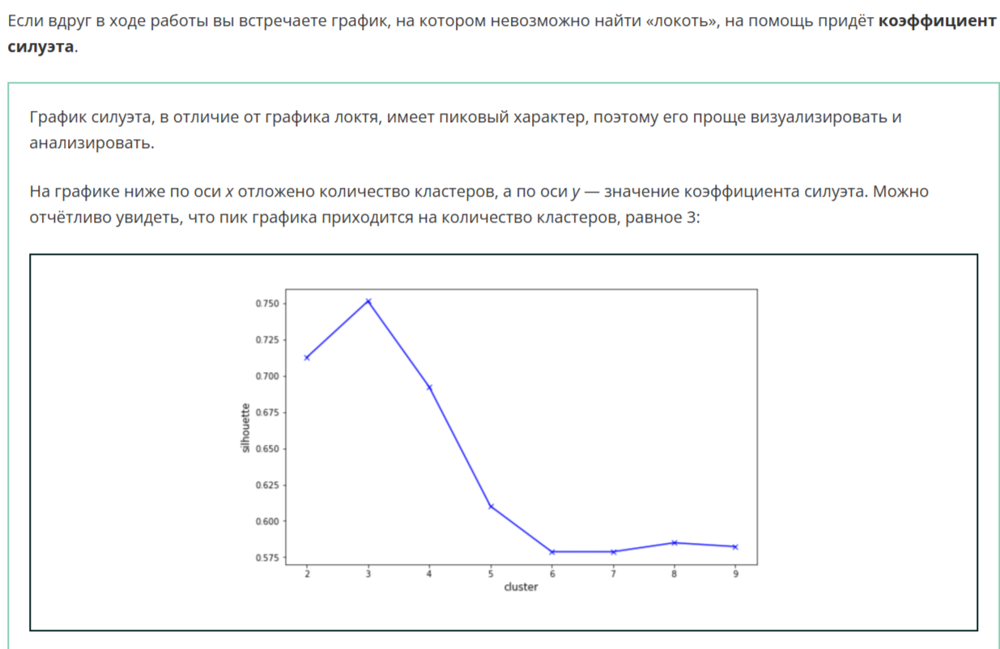

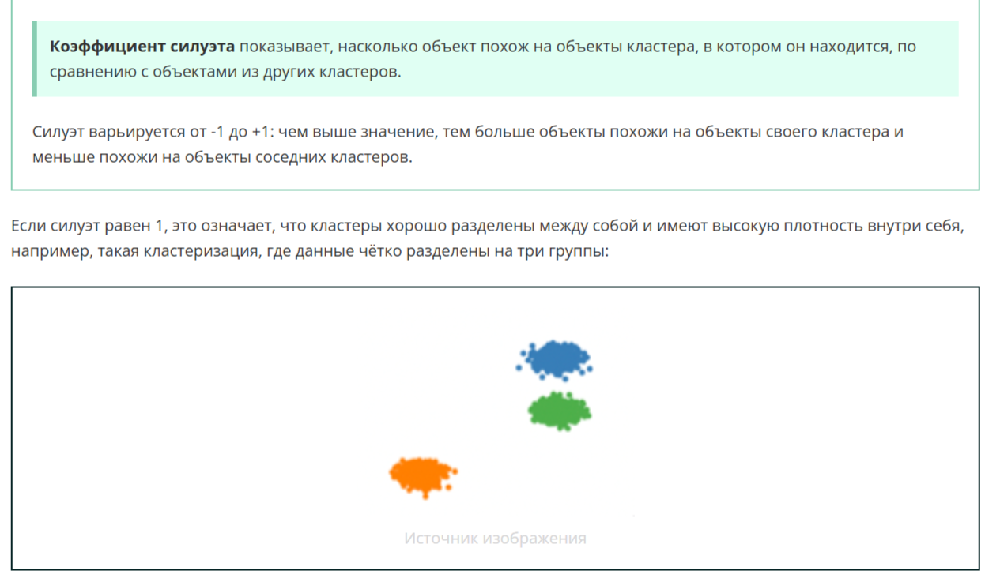

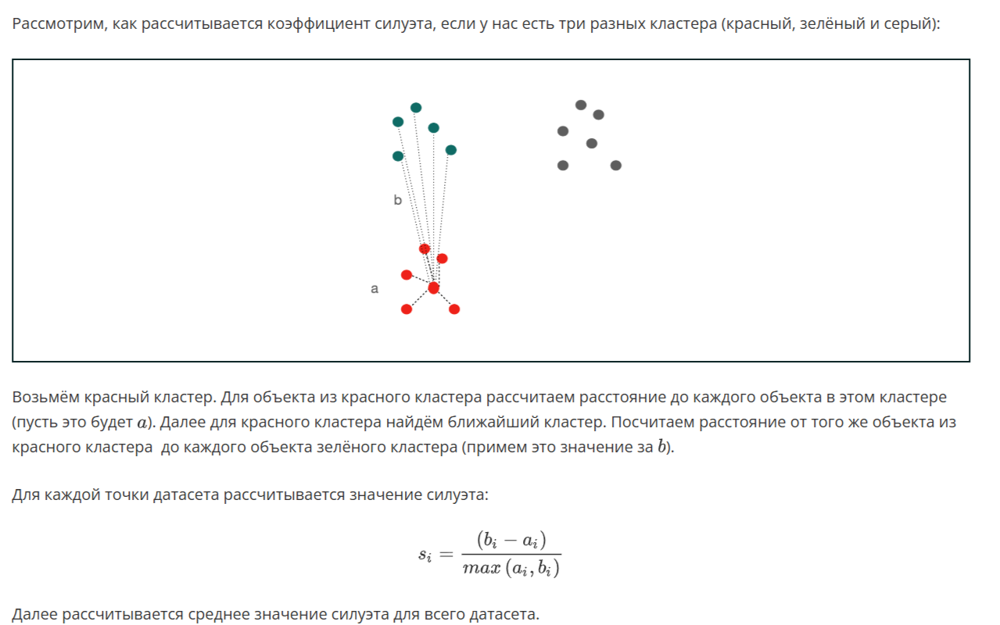

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [6]:
df = pd.read_csv(r'C:\Users\user\Desktop\Skilfactory\data\values_from_the_instrument.csv')

In [7]:
df

,x1,x2
0,48.848600,67.882051
1,60.343304,74.215686
2,48.155670,68.313920
3,48.546786,68.090451
4,47.124609,67.132278
...,...,...
995,64.147007,59.058766
996,48.973928,67.454876
997,62.605739,58.633415
998,47.122895,67.308920


<Axes: >

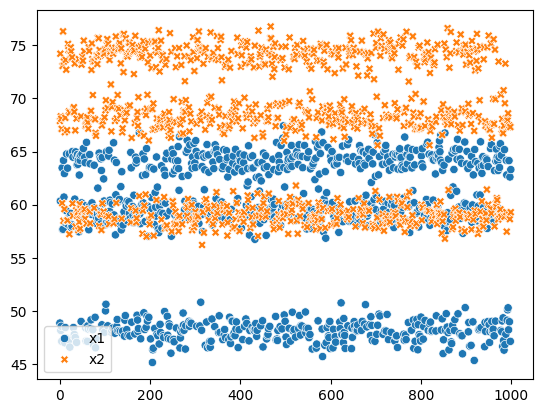

In [8]:
#визуализируем
sns.scatterplot(df)

<Axes: xlabel='cluster', ylabel='silhouette'>

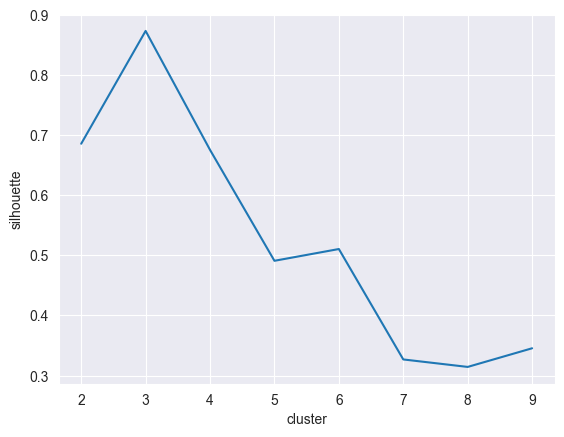

In [20]:
def get_silhouette(cluster_num, X):
    k_means = KMeans(n_clusters=cluster_num)
    k_means.fit(X)
    silhouette = silhouette_score(X, k_means.predict(X))
    return silhouette

silhouette_res = {"silhouette": [], "cluster": []}

X = df

for cluster_num in range(2, 10):
    silhouette_res["silhouette"].append(get_silhouette(cluster_num, X))
    silhouette_res["cluster"].append(cluster_num)

silhouette_df = pd.DataFrame(silhouette_res)
sns.lineplot(silhouette_df, y = 'silhouette', x='cluster')

<Axes: xlabel='x1', ylabel='x2'>

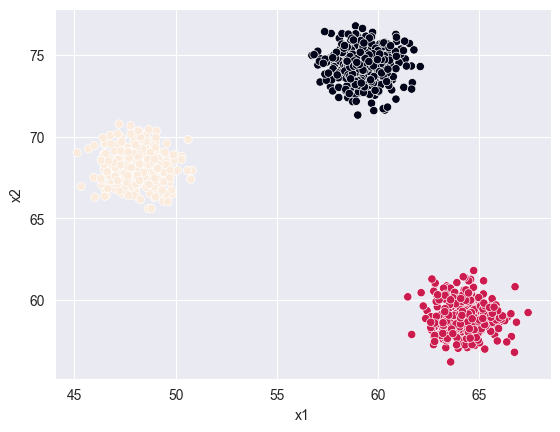

In [26]:
k_means = KMeans(n_clusters=3)
k_means.fit(df)
predictions = k_means.labels_
df['k_3'] = predictions
sns.scatterplot(x=df['x1'], y=df['x2'], c=df['k_3'])

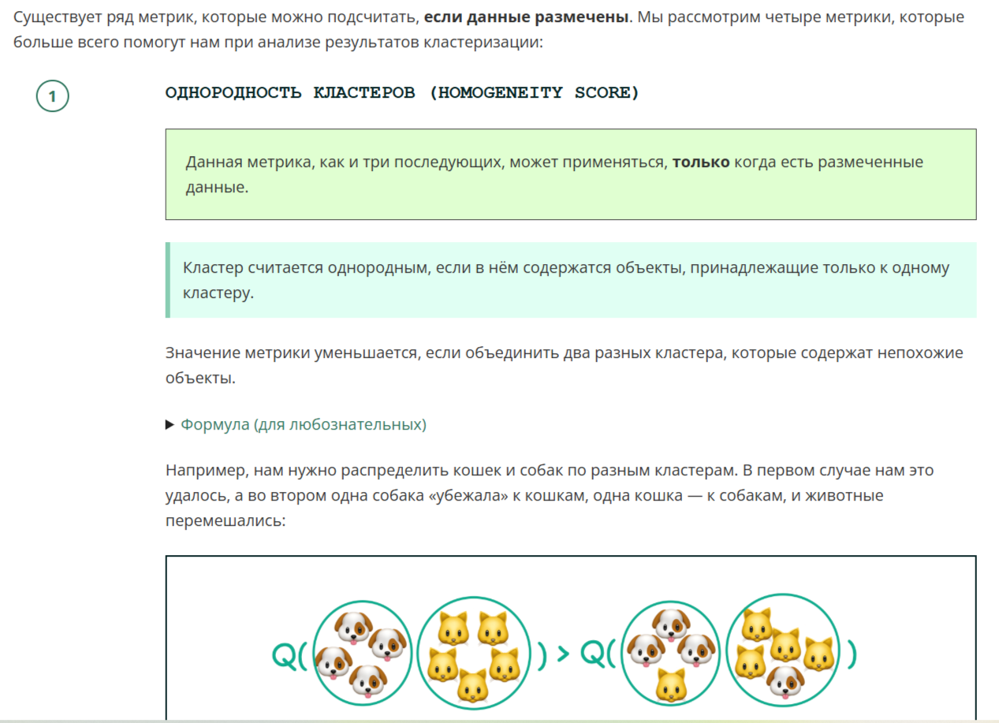

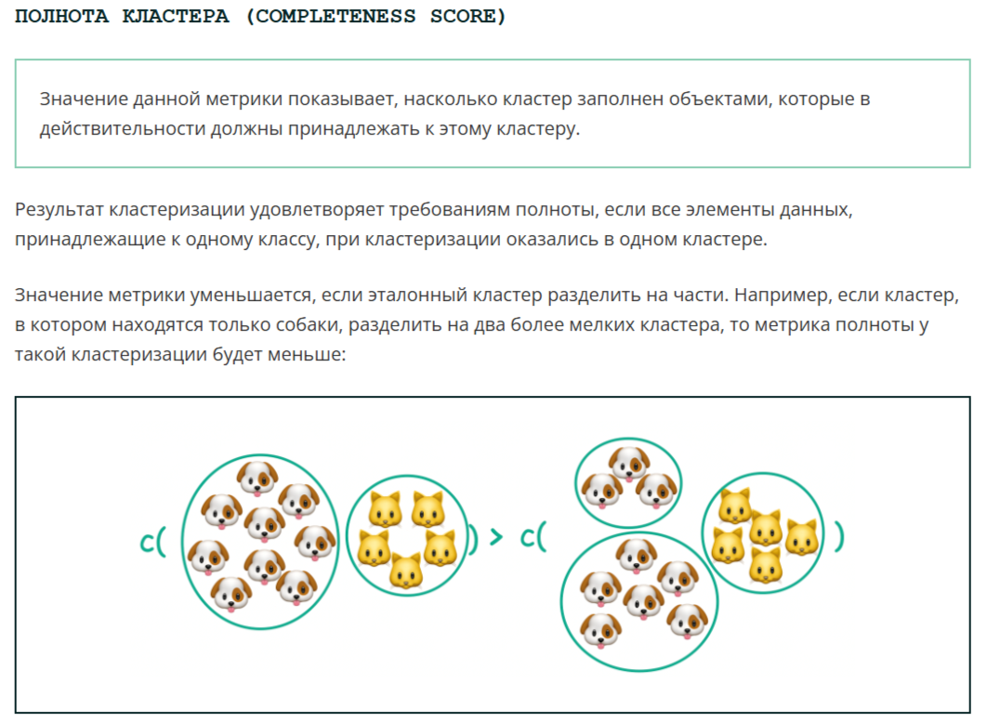

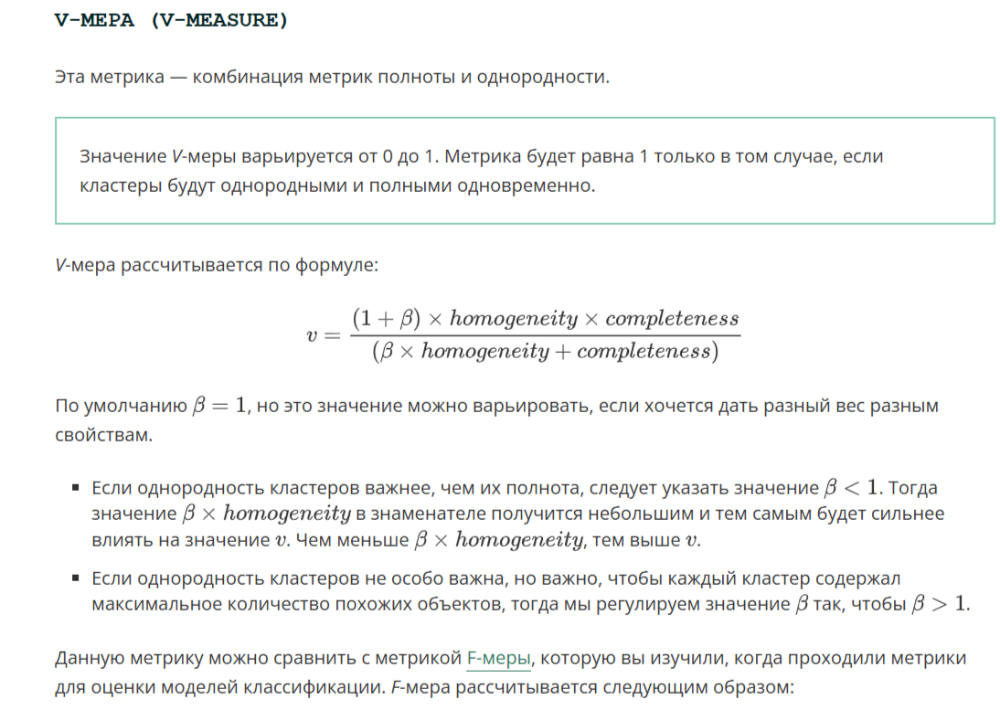

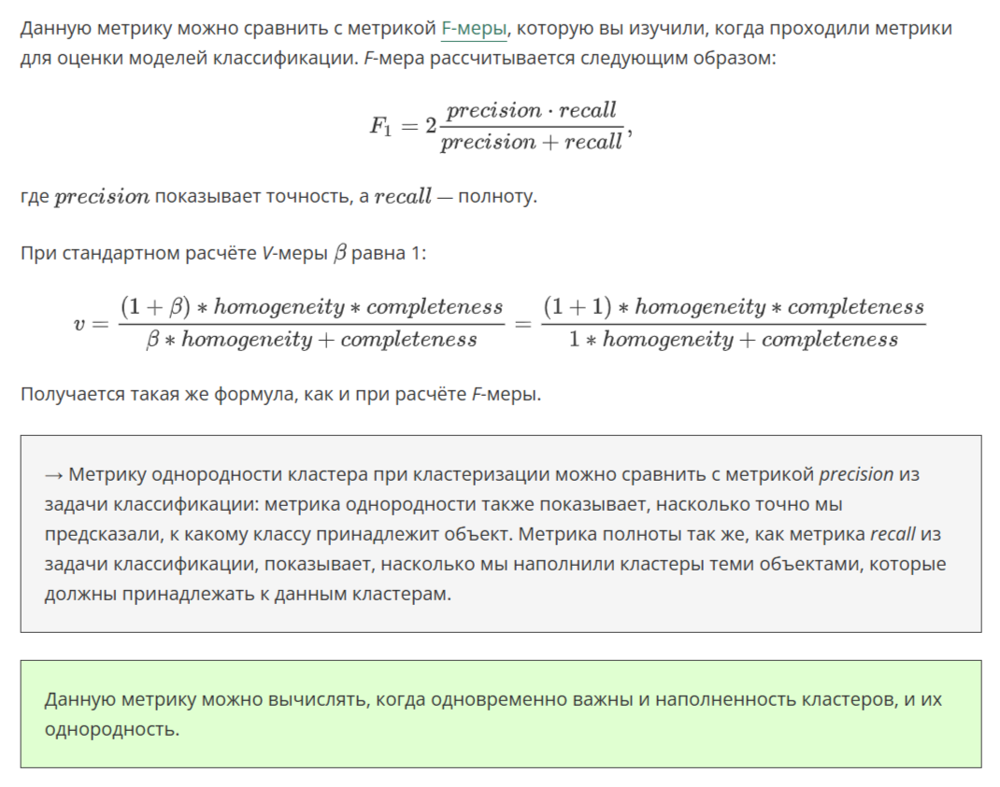

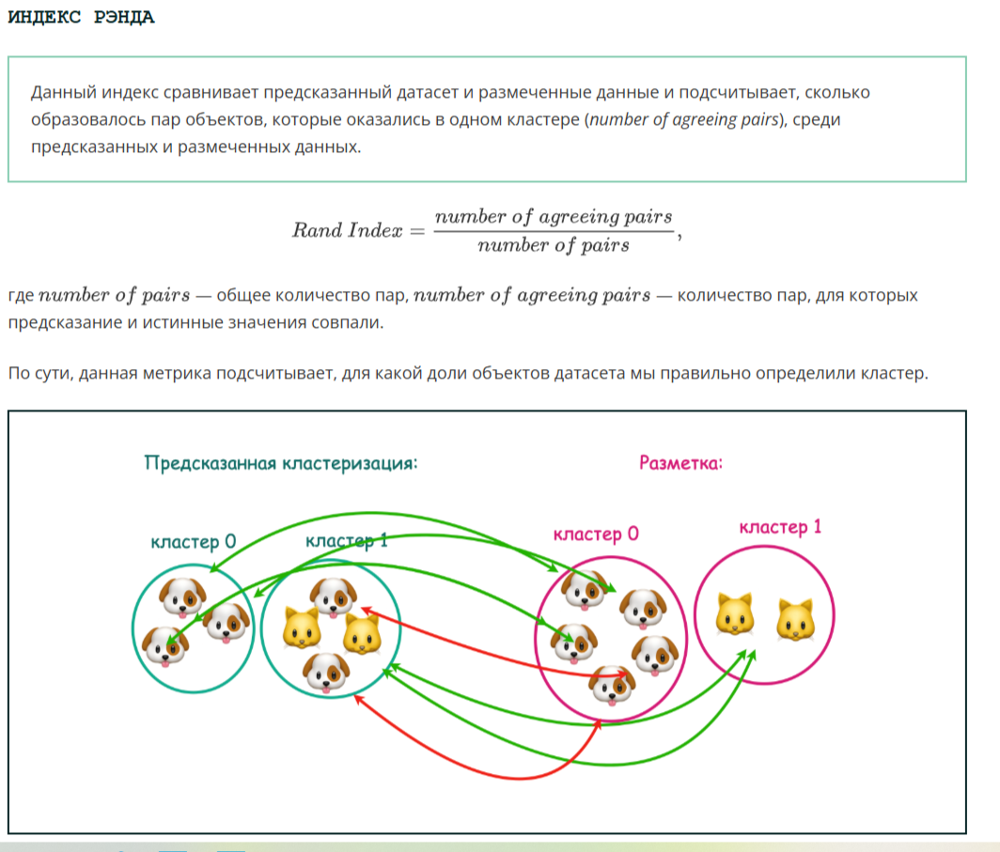

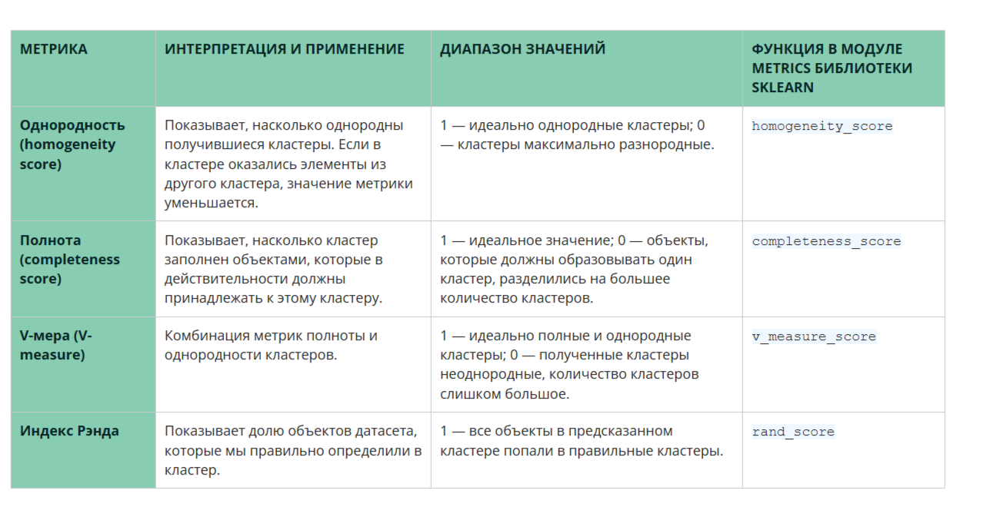

Для пяти объектов вы провели кластеризацию k-means. Известно, что объекты должны относиться к следующим кластерам: 1, 2, 2, 1, 0. В ходе работы алгоритма вы получили следующие предсказания для каждого элемента: 1, 0, 2, 1, 2.

Рассчитайте метрику однородности полученных кластеров. Введите полученное значение, округлив его до второго знака после точки-разделителя.

In [27]:
from sklearn.metrics import homogeneity_score

In [28]:
# теперь посчитаем насколько однородными получились кластеры с покемонами
print(homogeneity_score(labels_true=[1, 2, 2, 1, 0], labels_pred=[1, 0, 2, 1, 2]))


0.737175493807016


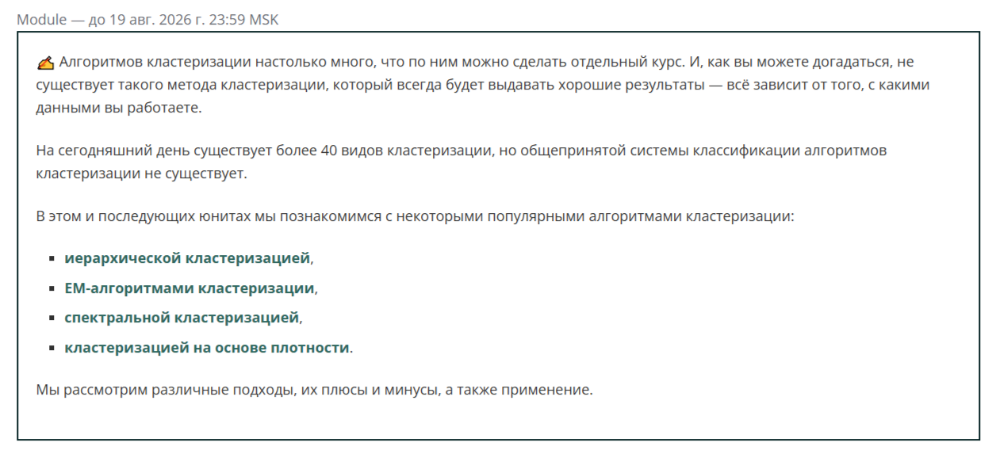

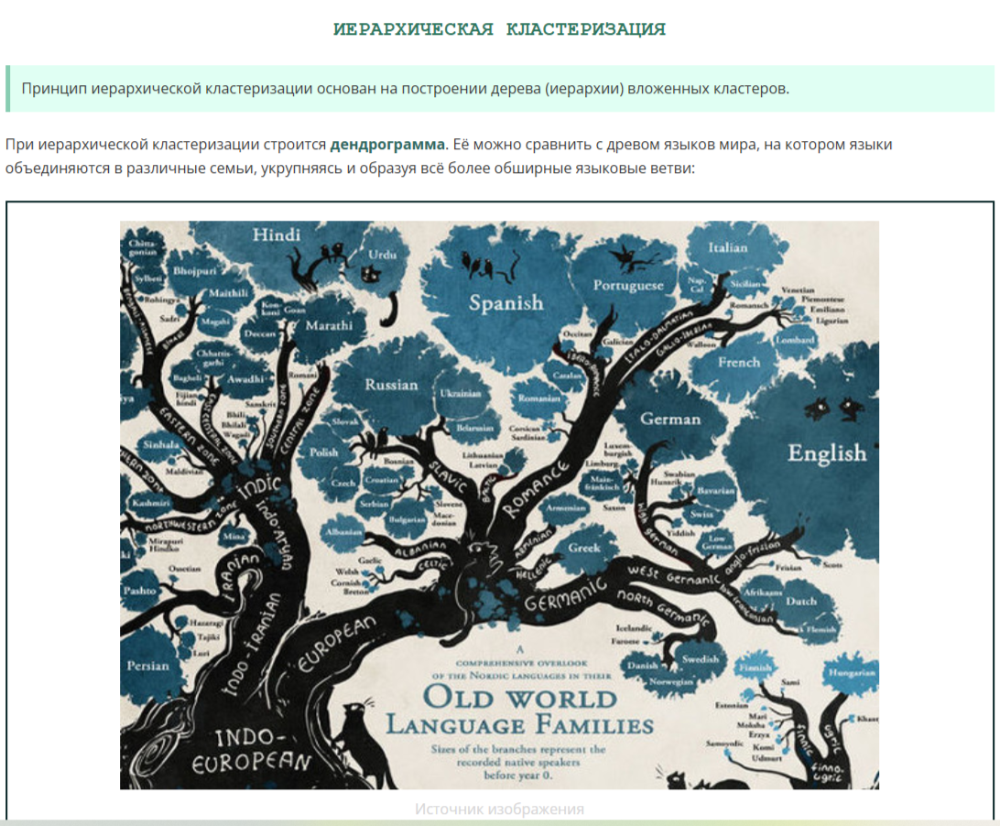

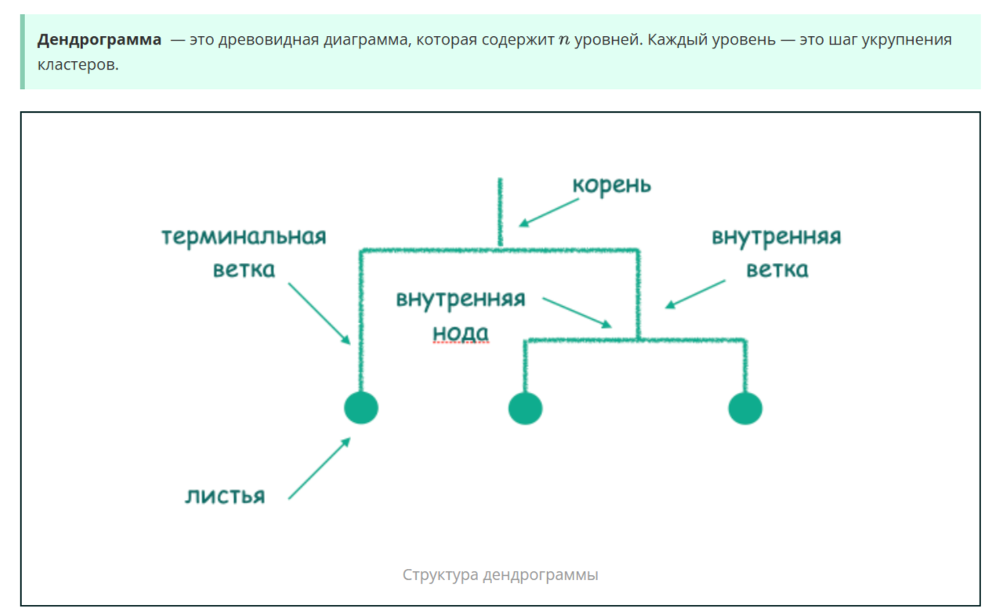

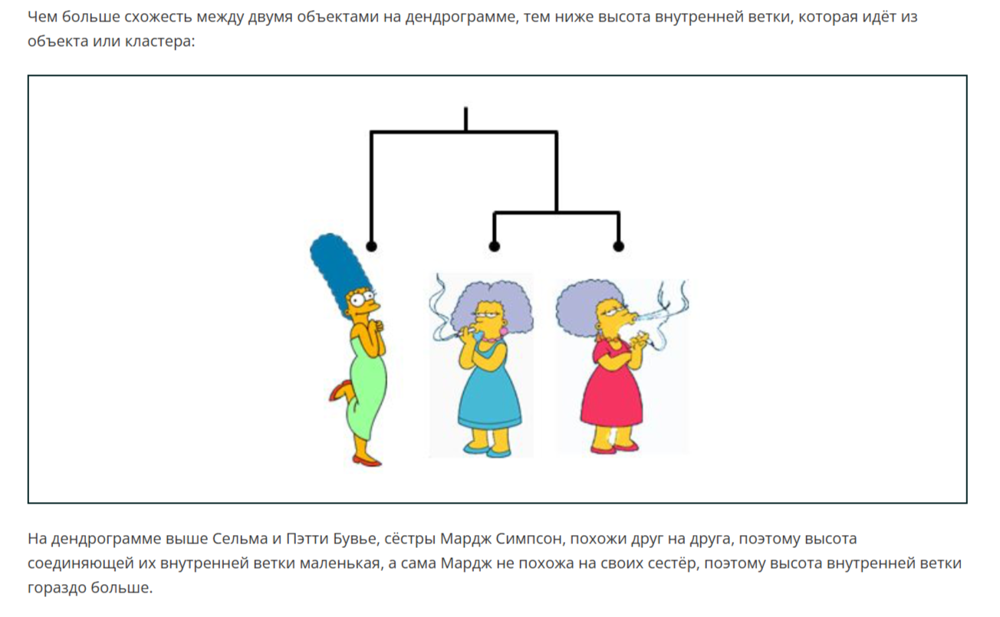

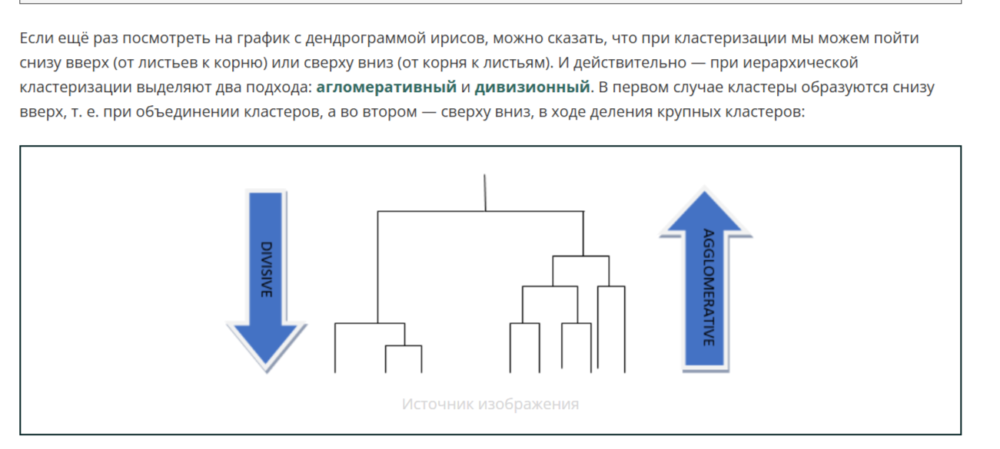

...

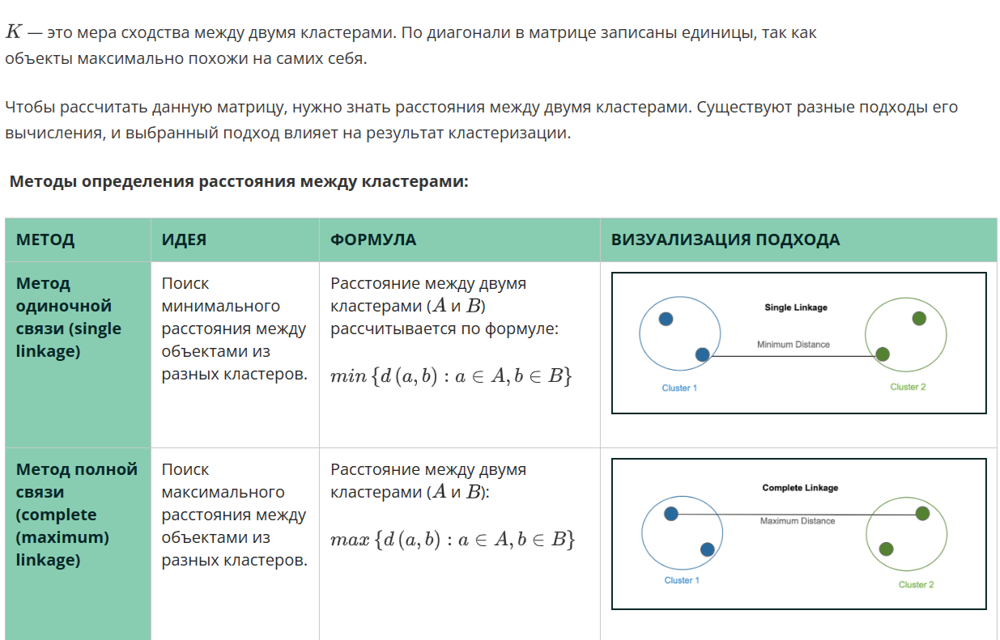

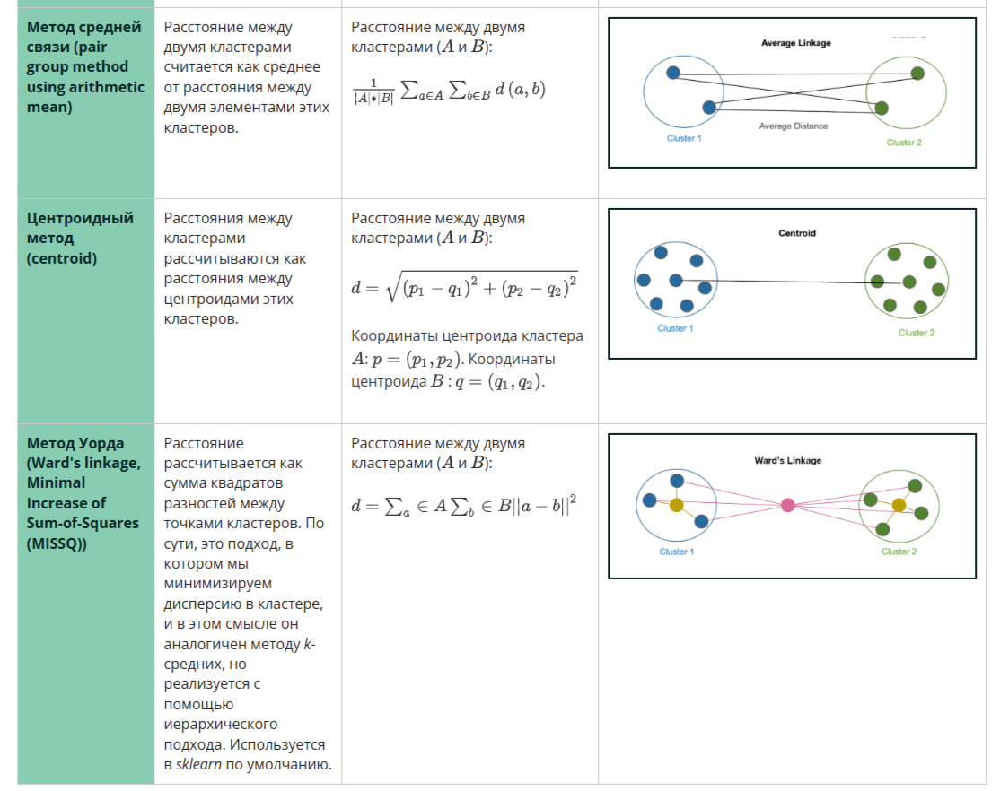

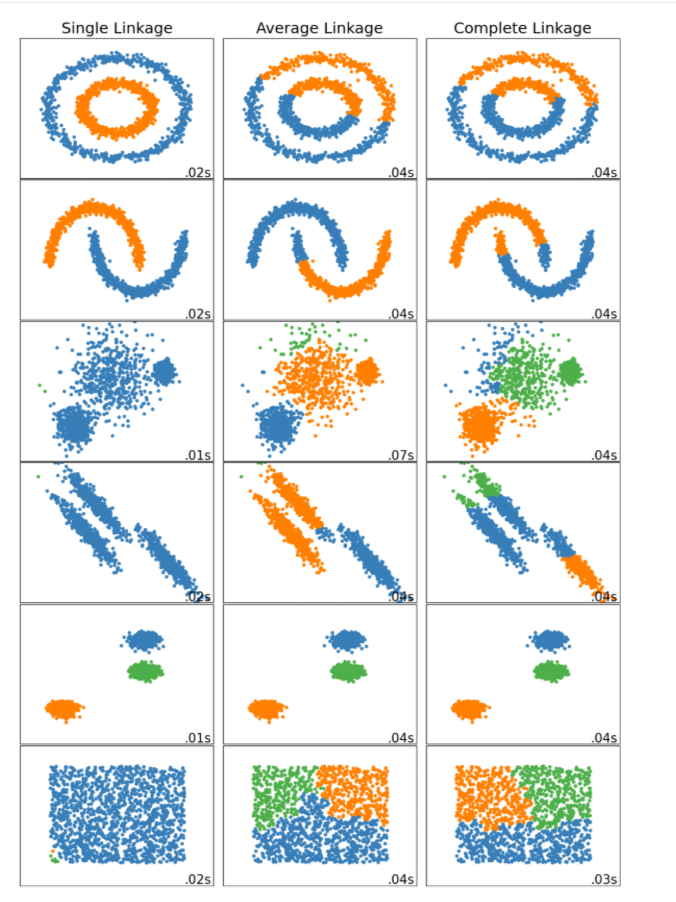

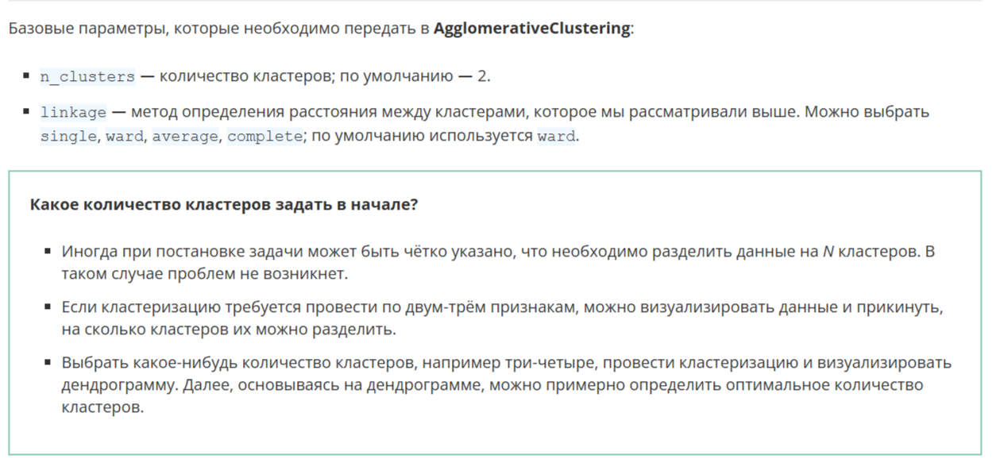

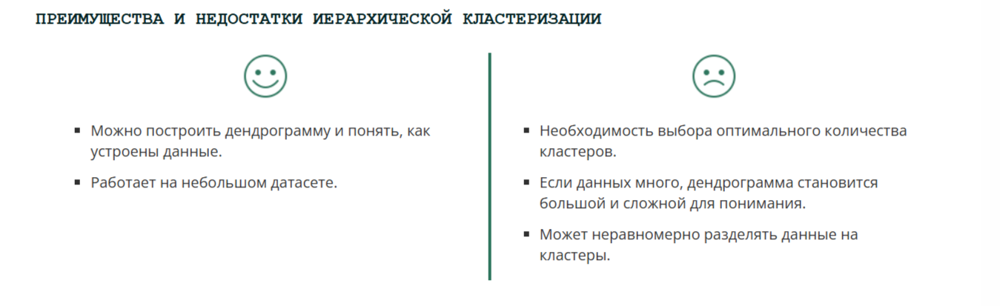

In [3]:
import pandas as pd

In [4]:
df = pd.read_csv(r'C:\Users\user\Desktop\Skilfactory\data\housing.csv')

In [5]:
df

,year,price
0,0.081091,23.790515
1,9.483270,10.784598
2,9.901805,10.003782
3,1.930438,21.879849
4,1.618601,21.851806
...,...,...
1350,12.580032,10.122039
1351,12.488949,9.934954
1352,10.693618,12.083653
1353,12.455530,10.304081


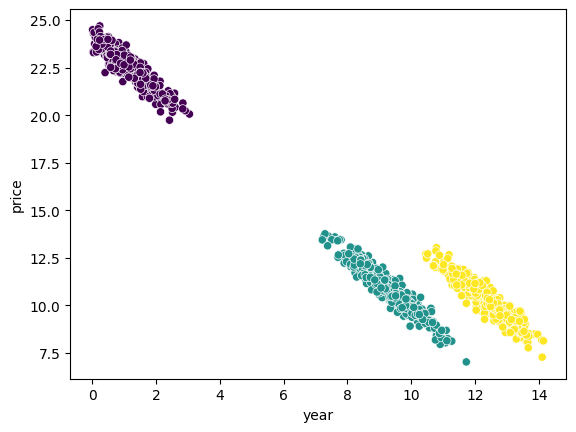

In [18]:
import numpy as np
from sklearn.mixture import GaussianMixture

gm_cluster = GaussianMixture(n_components=3)
gm_cluster.fit(df)
gm_pred = gm_cluster.predict(df)
df['pred'] = gm_pred
import seaborn as sns
sns.scatterplot(df, x='year', y='price', c=df['pred']);

In [19]:
X = df[['year', 'price']]

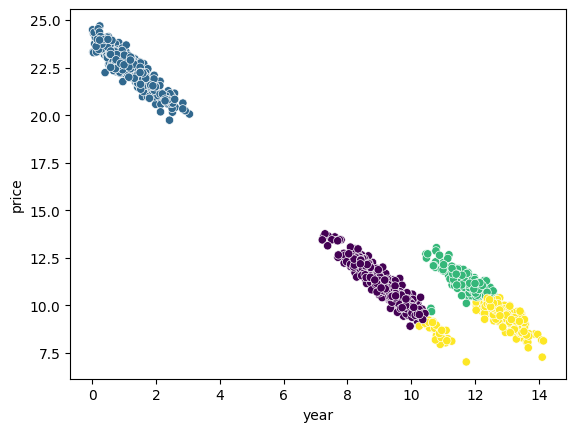

In [22]:
from sklearn.cluster import KMeans

k_means = KMeans(4)
k_means.fit(X)
predX = k_means.predict(X)
df['k_means'] = predX
import seaborn as sns
sns.scatterplot(df, x='year', y='price', c=df['k_means']);

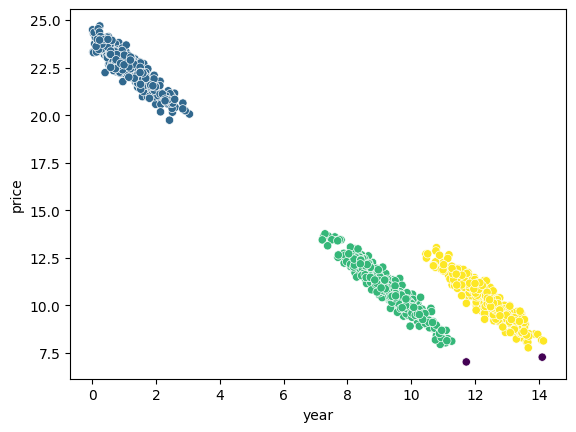

In [28]:
from sklearn.cluster import DBSCAN
clust = DBSCAN(eps = 0.5, min_samples = 5).fit(X)

import seaborn as sns
sns.scatterplot(df, x='year', y='price', c=clust.labels_);

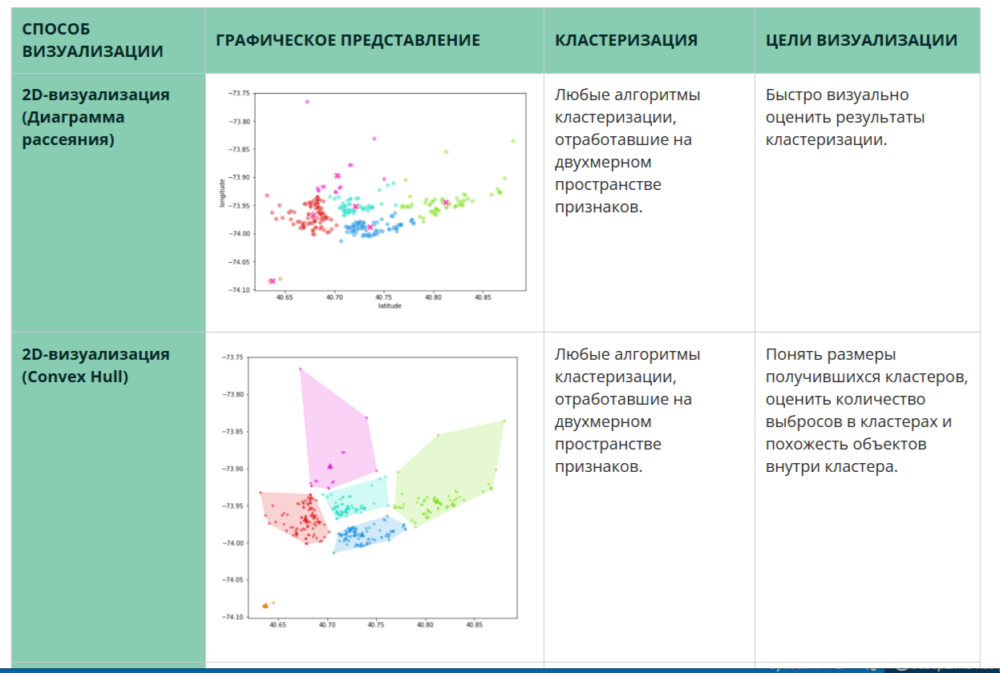

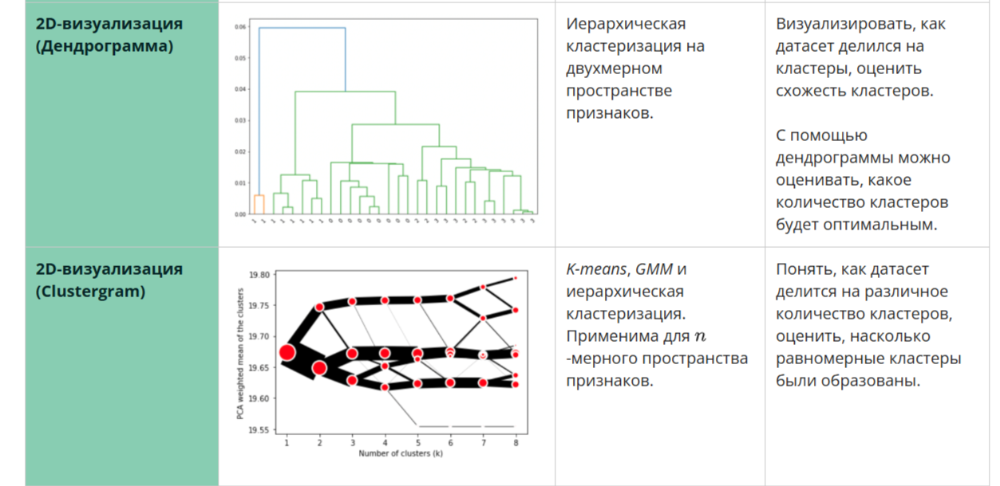

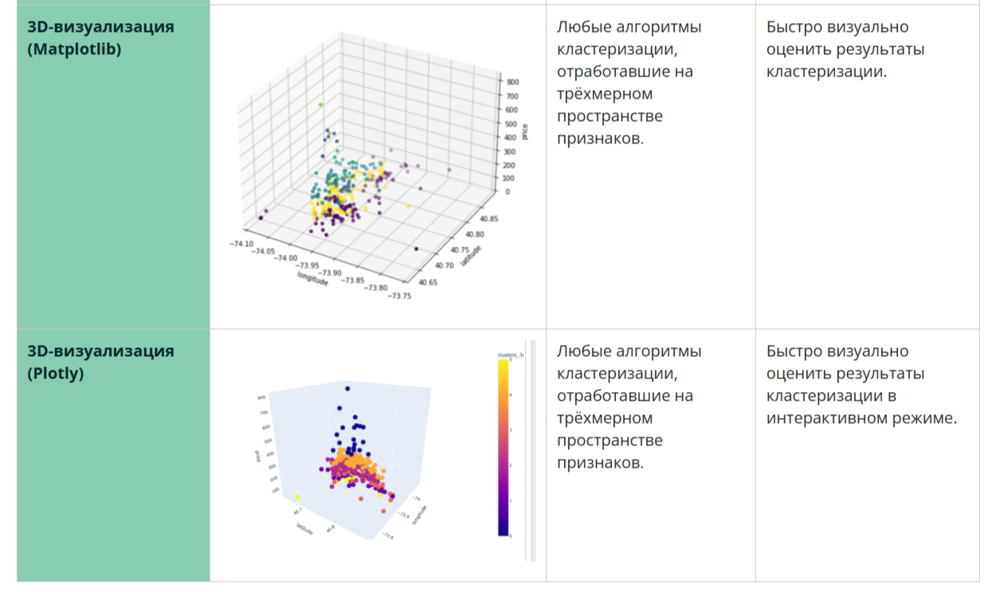

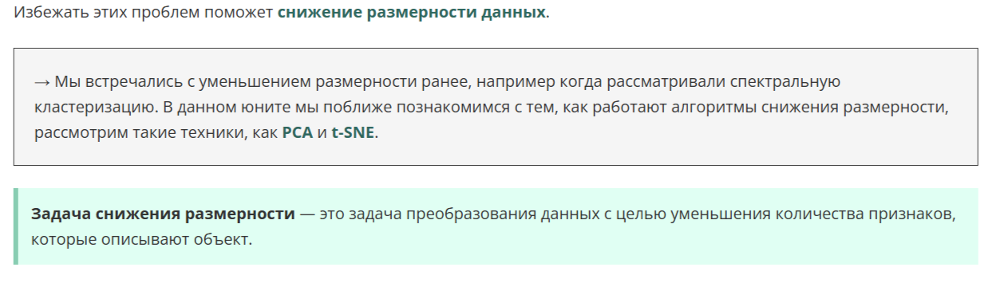

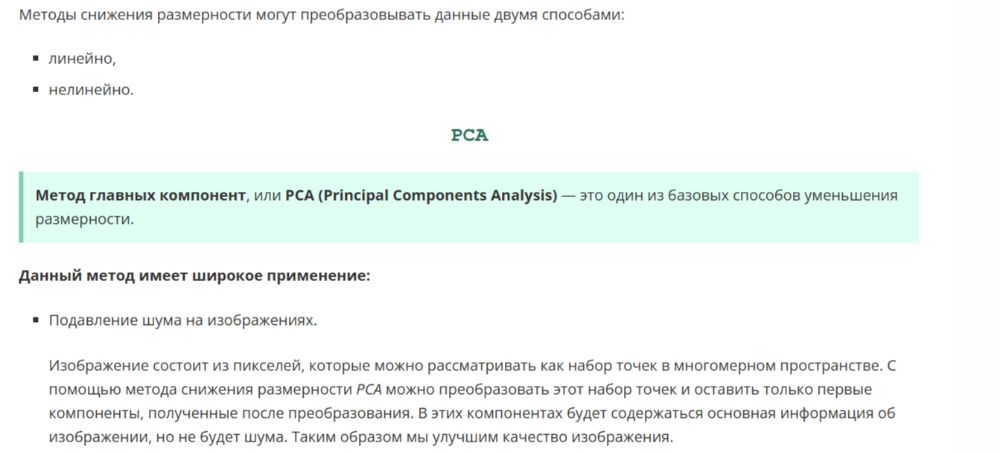

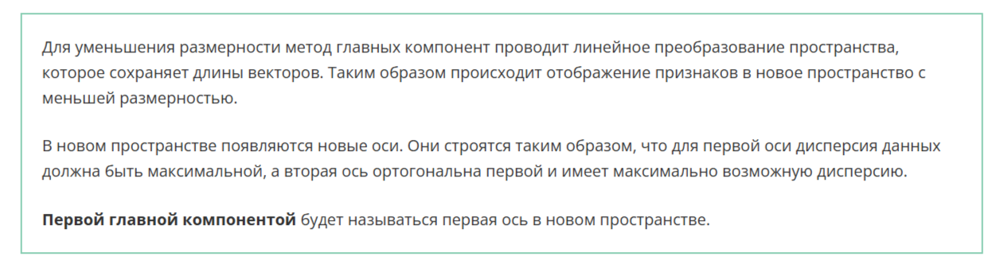

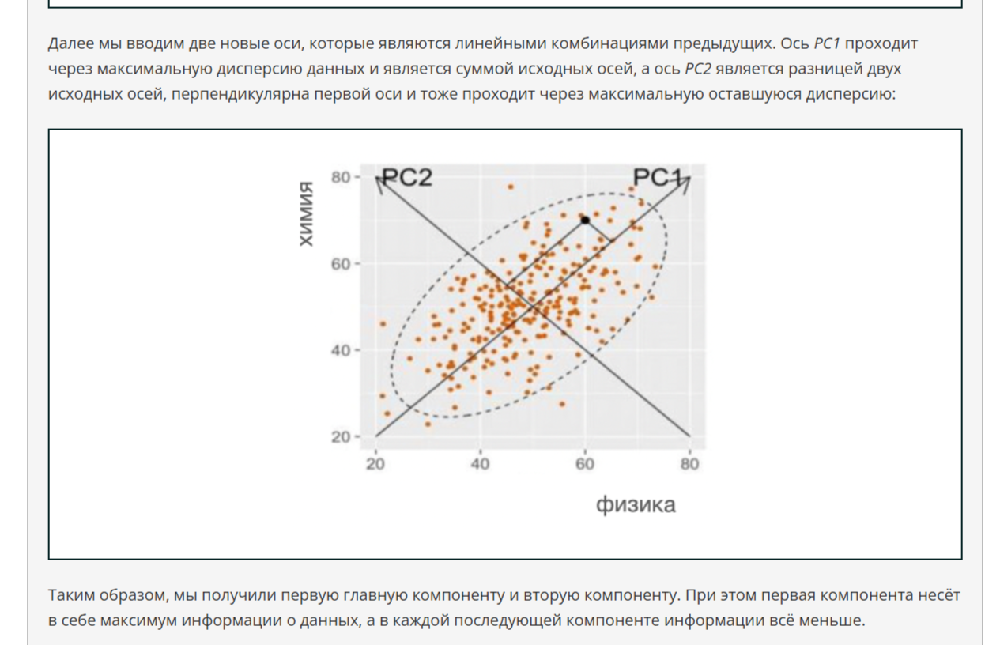

In [1]:
# из модуля decomposition библиотеки sklearn импортируем класс PCA
from sklearn.decomposition import PCA
# создаём объект класса PCA
# n_components — задаём количество компонентов для проведения трансформации
pca = PCA(n_components=2, random_state=42)
# обучаем модель на данных X
pca.fit(X)
# применяем уменьшение размерности к матрице X
pca.transform(X)

NameError: name 'X' is not defined

In [ ]:
pca.fit_transform(X)

In [2]:
# загрузим датасет MNIST
from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split

dataset = fetch_openml("mnist_784")
# загрузим признаки в переменную X  
X = dataset['data']
# загрузим «ответы» в переменную y
y = dataset['target']
# разделим данные с помощью sklearn на данные для обучения и теста
train_x, test_x, train_y, test_y = train_test_split(X, y, test_size=0.1, random_state=0)

# импортируем StandardScaler для стандартизации данных
from sklearn.preprocessing import StandardScaler

# создадим объект класса StandardScaler
scaler = StandardScaler()
scaler.fit(train_x)
# трансформируем датасеты train_x и test_x
train_x = scaler.transform(train_x)
test_x = scaler.transform(test_x)

# импортируем класс PCA
from sklearn.decomposition import PCA

# создадим объект класса PCA
pca = PCA(n_components=300)
pca.fit(train_x)
# уменьшим размерность данных
train_x_pca = pca.transform(train_x)
test_x_pca = pca.transform(test_x)

c:\Users\user\anaconda3\Lib\site-packages\sklearn\datasets\_openml.py:74: RuntimeWarning: Invalid cache, redownloading file
  warn("Invalid cache, redownloading file", RuntimeWarning)


RemoteDisconnected: Remote end closed connection without response

In [ ]:
print(len(train_x[0]))
print(len(train_x_pca[0]))

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from time import time

# напишем функцию, которая на вход принимает X и y, а возвращает модель и время
def get_time_and_accuracy(train_x, train_y, test_x, test_y):
    # создадим объект класса LogisticRegression
    log_reg_model = LogisticRegression(max_iter=1000)
    # запишем время с начала эпохи в секундах до обучения модели
    start_time = time()
    # обучим модель
    log_reg_model.fit(train_x, train_y)    
    # запишем время с начала эпохи в секундах после обучения
    end_time = time()
    # подсчитаем время, потраченное на обучение модели
    delta_time = end_time-start_time
    # предскажем на тестовых данных
    y_pred = log_reg_model.predict(test_x)
    # посчитаем скор для тестового предсказания
    score = accuracy_score(test_y, y_pred)
    # вернём время, потраченное на обучение, и качество полученной модели
    return delta_time, score

model_pca_time, model_pca_acc = get_time_and_accuracy(train_x_pca, train_y, test_x_pca, test_y)
print(f"Модель, построенная на признаках, полученных после уменьшения размерности. Время обучения {model_pca_time}, метрика модели {model_pca_acc}")
# Модель, построенная на признаках, полученных после уменьшения размерности. Время обучения 54.12072825431824, метрика модели 0.9255714285714286

model_time, model_acc = get_time_and_accuracy(train_x, train_y, test_x, test_y)
print(f"Модель, построенная на всех исходных признаках. Время обучения {model_time}, метрика модели {model_acc}")
# Модель, построенная на всех исходных признаках. Время обучения 108.04033303260803, метрика модели 0.9187142857142857

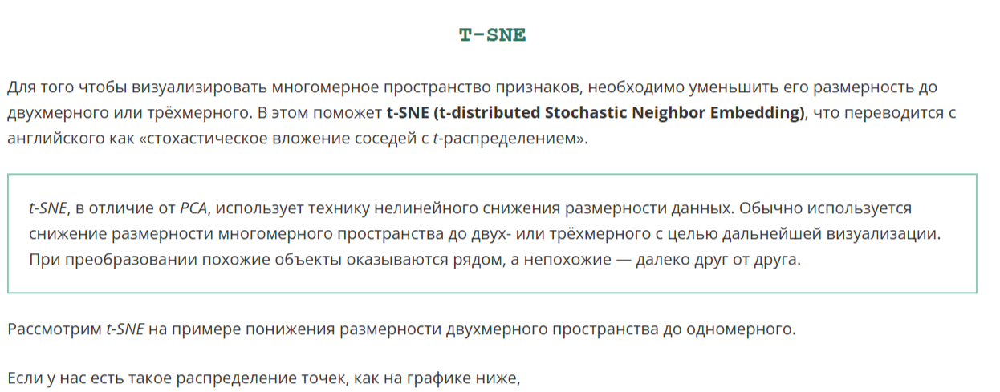

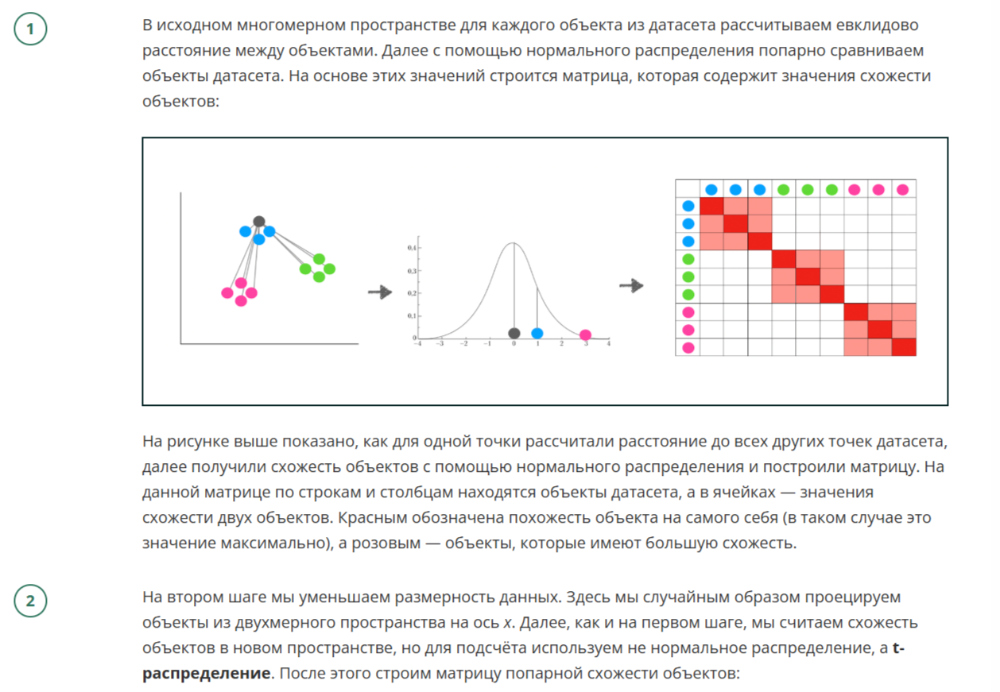

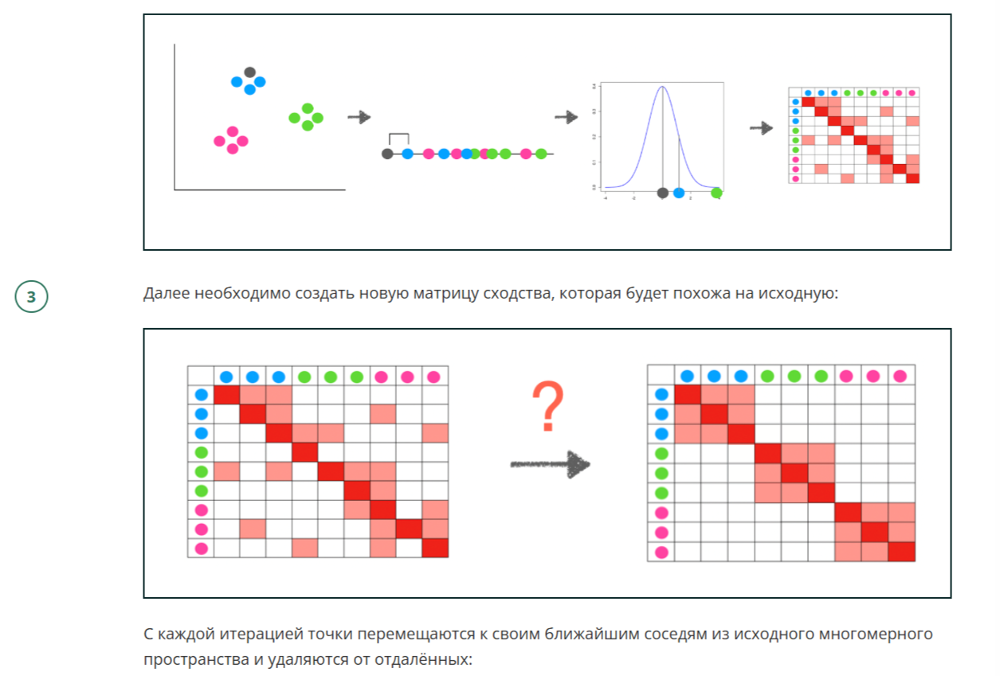

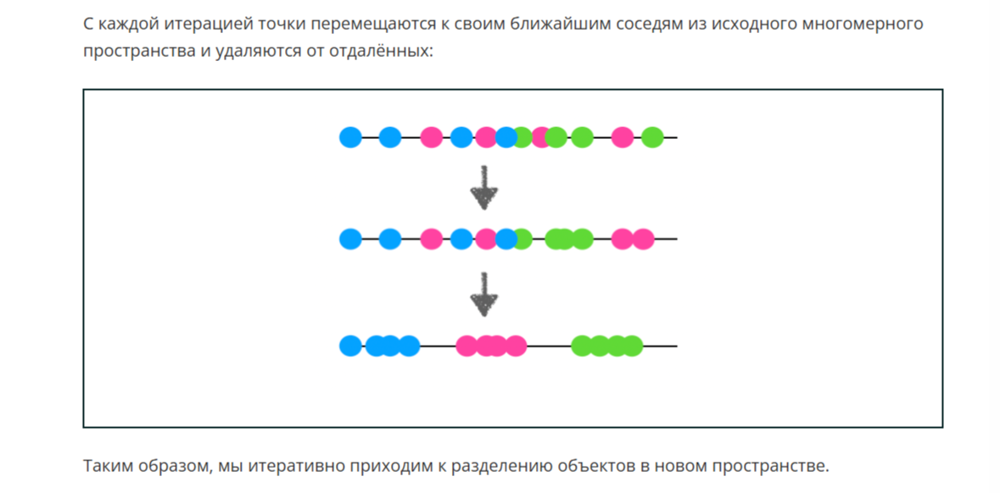

In [ ]:
# импортируем класс TSNE из модуля manifold библиотеки sklearn
from sklearn.manifold import TSNE

# создаём объект класса TSNE
# n_components — размерность нового пространства
tsne = TSNE(n_components=2, perplexity=30, n_iter=500, random_state=42)
# обучаем модель на данных X и производим трансформацию
tsne.fit_transform(X)

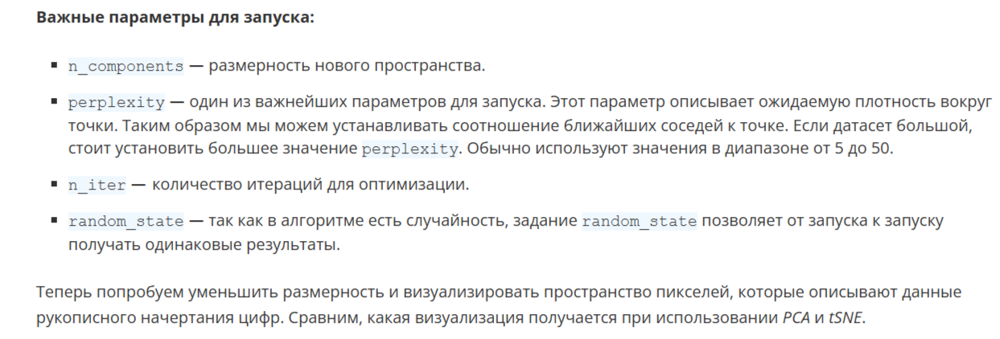

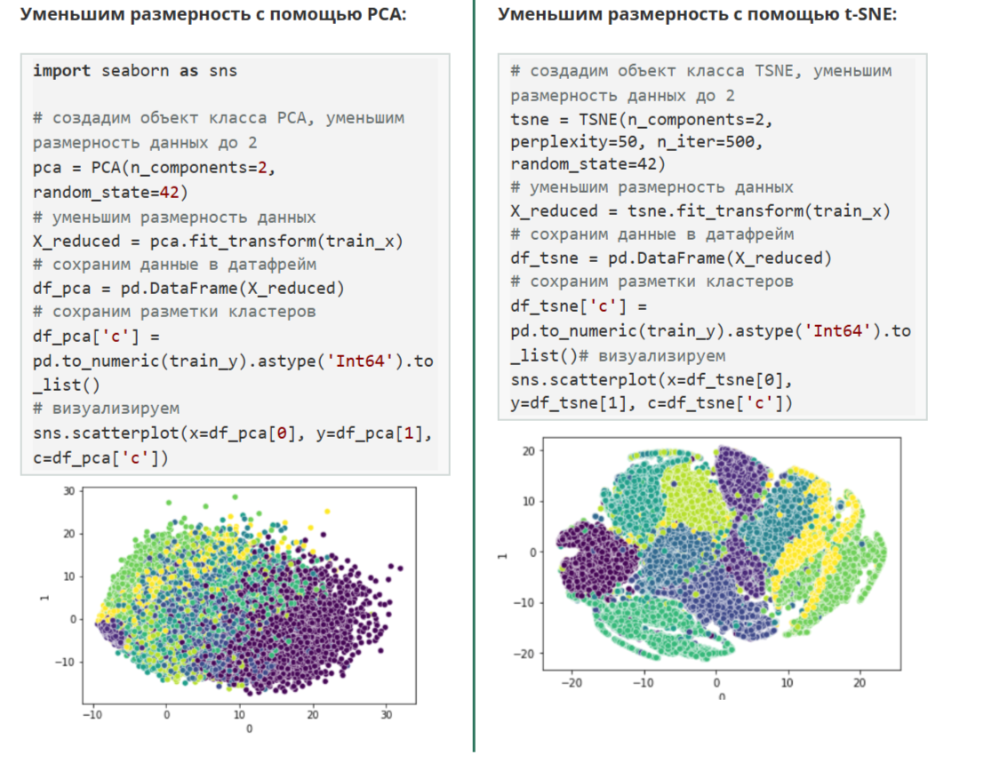

In [3]:
import seaborn as sns

# создадим объект класса PCA, уменьшим размерность данных до 2
pca = PCA(n_components=2, random_state=42)
# уменьшим размерность данных
X_reduced = pca.fit_transform(train_x)
# сохраним данные в датафрейм
df_pca = pd.DataFrame(X_reduced)
# сохраним разметки кластеров
df_pca['c'] = pd.to_numeric(train_y).astype('Int64').to_list()
# визуализируем
sns.scatterplot(x=df_pca[0], y=df_pca[1], c=df_pca['c'])

NameError: name 'train_x' is not defined

In [ ]:
# создадим объект класса TSNE, уменьшим размерность данных до 2
tsne = TSNE(n_components=2, perplexity=50, n_iter=500, random_state=42)
# уменьшим размерность данных
X_reduced = tsne.fit_transform(train_x)
# сохраним данные в датафрейм
df_tsne = pd.DataFrame(X_reduced)
# сохраним разметки кластеров
df_tsne['c'] = pd.to_numeric(train_y).astype('Int64').to_list()# визуализируем
sns.scatterplot(x=df_tsne[0], y=df_tsne[1], c=df_tsne['c'])

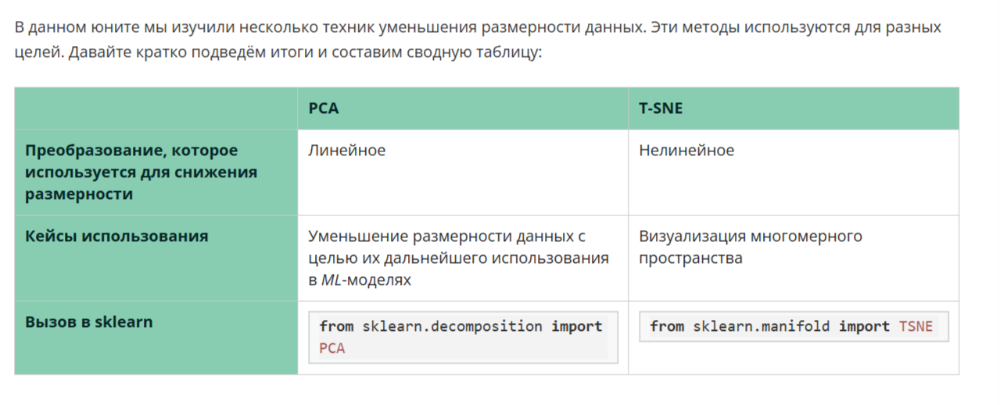